# ASSIGNMENT 2: WIND SPEED MEASUREMENTS

## Imports

In [14]:
import pandas as pd
import pymysql.cursors
import matplotlib.pyplot as plt
import numpy as np

## Import Data 

Connect to the MySQL database 

In [ ]:
#db=pymysql.connect(host="data02.windenergy.dtu.dk",user="students",password="H040",charset='utf8')

Execute the SQL command on the server and load the results in the dataframe. Treat field "name" as a date-time and use this as the index of the dataframe.

In [ ]:
#WindData=pd.read_sql("select * from c46400.dataset_as03;",con=db,parse_dates="name",index_col="name")
#WindData.describe()

/tmp/ipykernel_11083/3642863314.py:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  WindData=pd.read_sql("select * from c46400.dataset_as03;",con=db,parse_dates="name",index_col="name")


,Cup116m_Mean,Cup116m_Stdv,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Stdv,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Stdv,...,Spd_stdv,Spd_min,Spd_max,Dir,Dir_stdv,W,W_stdv,Available,CNR,Broad
count,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,...,7840.000000,7837.000000,7840.000000,7840.000000,7807.000000,7575.000000,7840.000000,7836.000000,7813.000000,7840.000000
mean,9.171476,0.667874,7.142197,11.040740,9.688137,0.677135,7.612990,11.575186,8.925705,0.688993,...,0.701821,6.306278,10.276677,170.043151,5.754241,0.083584,0.370974,99.300536,-10.277487,1.206926
std,4.712528,0.445456,3.670575,5.679712,4.933472,0.454641,4.293733,5.651078,4.619114,0.459581,...,0.359827,2.892863,4.264462,89.185167,5.258565,0.288158,0.206616,5.428837,5.442326,0.215100
min,0.000000,0.000000,0.000000,0.000000,0.522059,0.000000,0.522059,0.522059,0.000000,0.000000,...,0.040000,0.010000,0.810000,0.100000,0.309996,-0.870000,0.030000,2.000000,-28.873700,0.520000
25%,6.133538,0.368242,4.795138,7.366343,6.405145,0.374129,4.949900,7.653950,5.975027,0.381133,...,0.450000,4.520000,7.590000,100.800000,3.482905,-0.040000,0.230000,100.000000,-13.452200,1.100000
50%,8.697975,0.585182,6.837950,10.397250,8.881545,0.591761,6.927900,10.679800,8.419600,0.602970,...,0.660000,6.230000,9.980000,146.300000,4.614180,0.040000,0.350000,100.000000,-10.518800,1.140000
75%,11.468300,0.870433,9.120593,13.776300,11.822550,0.878780,9.344527,14.246650,11.126575,0.896857,...,0.890000,7.910000,12.340000,258.125000,6.199320,0.140000,0.480000,100.000000,-8.134290,1.220000
max,35.419800,4.424590,24.684500,42.342500,35.611500,6.531950,24.667700,43.244400,35.281400,4.317390,...,2.730000,19.940000,32.170000,359.300000,57.243000,4.470000,2.780000,100.000000,16.077200,4.100000


Save dataframe as CSV so there is no need to connect to MySQL database every time

In [ ]:
#WindData.to_csv('WindData.csv', index=True)

In [55]:
WindData = pd.read_csv('WindData.csv', parse_dates=True, index_col=0)
WindData.describe()

,Cup116m_Mean,Cup116m_Stdv,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Stdv,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Stdv,...,Spd_stdv,Spd_min,Spd_max,Dir,Dir_stdv,W,W_stdv,Available,CNR,Broad
count,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,12084.000000,...,7840.000000,7837.000000,7840.000000,7840.000000,7807.000000,7575.000000,7840.000000,7836.000000,7813.000000,7840.000000
mean,9.171476,0.667874,7.142197,11.040740,9.688137,0.677135,7.612990,11.575186,8.925705,0.688993,...,0.701821,6.306278,10.276677,170.043151,5.754241,0.083584,0.370974,99.300536,-10.277487,1.206926
std,4.712528,0.445456,3.670575,5.679712,4.933472,0.454641,4.293733,5.651078,4.619114,0.459581,...,0.359827,2.892863,4.264462,89.185167,5.258565,0.288158,0.206616,5.428837,5.442326,0.215100
min,0.000000,0.000000,0.000000,0.000000,0.522059,0.000000,0.522059,0.522059,0.000000,0.000000,...,0.040000,0.010000,0.810000,0.100000,0.309996,-0.870000,0.030000,2.000000,-28.873700,0.520000
25%,6.133538,0.368242,4.795138,7.366343,6.405145,0.374129,4.949900,7.653950,5.975027,0.381133,...,0.450000,4.520000,7.590000,100.800000,3.482905,-0.040000,0.230000,100.000000,-13.452200,1.100000
50%,8.697975,0.585182,6.837950,10.397250,8.881545,0.591761,6.927900,10.679800,8.419600,0.602970,...,0.660000,6.230000,9.980000,146.300000,4.614180,0.040000,0.350000,100.000000,-10.518800,1.140000
75%,11.468300,0.870433,9.120593,13.776300,11.822550,0.878780,9.344527,14.246650,11.126575,0.896857,...,0.890000,7.910000,12.340000,258.125000,6.199320,0.140000,0.480000,100.000000,-8.134290,1.220000
max,35.419800,4.424590,24.684500,42.342500,35.611500,6.531950,24.667700,43.244400,35.281400,4.317390,...,2.730000,19.940000,32.170000,359.300000,57.243000,4.470000,2.780000,100.000000,16.077200,4.100000


In [56]:
WindData

,Cup116m_Mean,Cup116m_Stdv,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Stdv,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Stdv,...,Spd_stdv,Spd_min,Spd_max,Dir,Dir_stdv,W,W_stdv,Available,CNR,Broad
name,,,,,,,,,,,,,,,,,,,,,
2015-09-07 11:00:00,2.29737,0.436317,1.018530,3.19492,2.29027,0.485124,0.857926,3.26162,2.26154,0.483488,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-07 11:10:00,2.33373,1.142690,0.540292,6.16171,2.02599,0.857467,0.522059,5.41615,2.08581,0.905685,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-07 11:20:00,2.65680,0.516193,1.161560,4.43188,2.19485,0.629905,0.861483,3.67092,2.30559,0.452007,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-07 11:30:00,2.19811,0.616147,0.622069,3.82984,2.15986,0.644860,0.522059,3.75443,2.12930,0.554329,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-07 11:40:00,2.81388,0.951594,1.138440,7.15864,2.70615,1.024040,0.950788,6.85117,2.73136,1.012010,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-30 23:10:00,15.83240,1.187640,12.371700,19.12550,15.86360,1.196350,12.384200,19.37910,15.61280,1.273340,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-30 23:20:00,18.25160,0.946480,15.250400,21.79970,18.32750,0.967669,15.620900,21.43100,18.22050,1.013660,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-30 23:30:00,18.61920,0.916737,15.319600,20.95830,18.68460,0.942880,15.596900,21.11640,18.52110,0.996963,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Questions

### Question 1)

Make 10 minute time-series plots of the different channels of mast data  (cups, sonic, temperature and vane) including mean, minimum and maximum. \
Can you identify any outliers or other erroneous data in the cup, sonic or wind vane data? Find a way of excluding these points from the further analysis. A useful technique is to replace excluded values by NaNs in the dataset. This way they will not be inadvertently used in mean calculations or included in regression plots.

#### Cup 116m

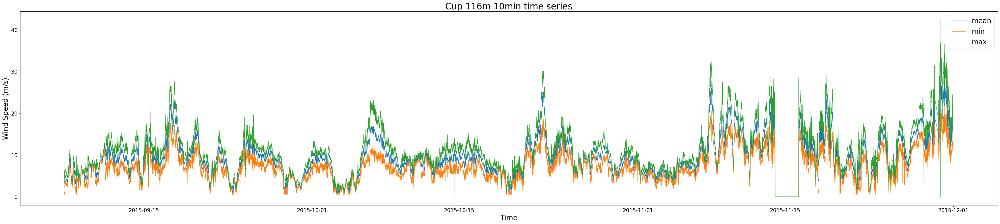

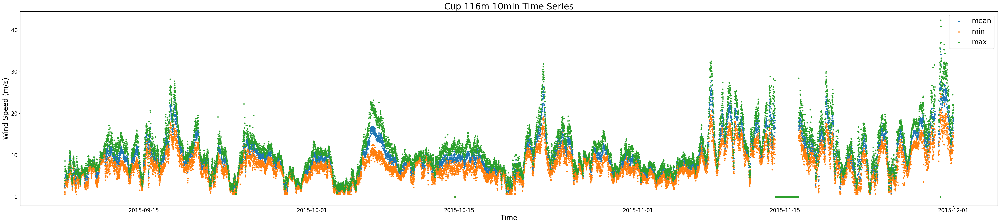

In [ ]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Cup116m_Mean'], label = 'mean', linewidth=1)
plt.plot(WindData['Cup116m_Min'], label = 'min', linewidth=1)
plt.plot(WindData['Cup116m_Max'], label = 'max', linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Cup 116m 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()


plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Cup116m_Mean'], label='mean', s=10)
plt.scatter(WindData.index, WindData['Cup116m_Min'], label='min', s=10)
plt.scatter(WindData.index, WindData['Cup116m_Max'], label='max', s=10)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Cup 116m 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

#### Cup 114m

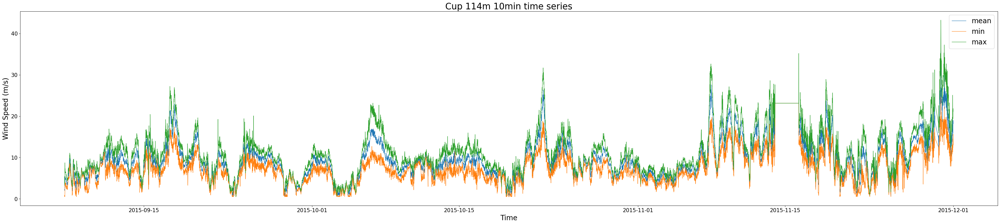

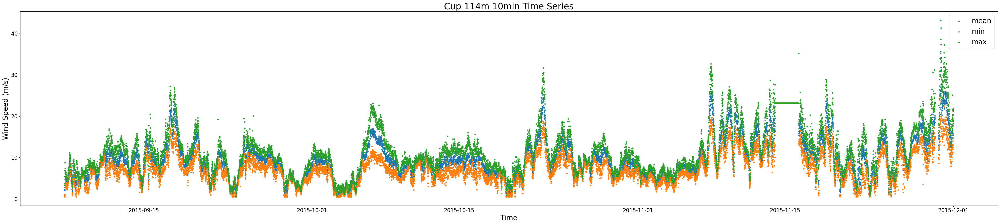

In [81]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Cup114m_Mean'], label = 'mean', linewidth=1)
plt.plot(WindData['Cup114m_Min'], label = 'min', linewidth=1)
plt.plot(WindData['Cup114m_Max'], label = 'max', linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Cup 114m 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Cup114m_Mean'], label='mean', s=10)
plt.scatter(WindData.index, WindData['Cup114m_Min'], label='min', s=10)
plt.scatter(WindData.index, WindData['Cup114m_Max'], label='max', s=10)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Cup 114m 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

#### Cup 100m

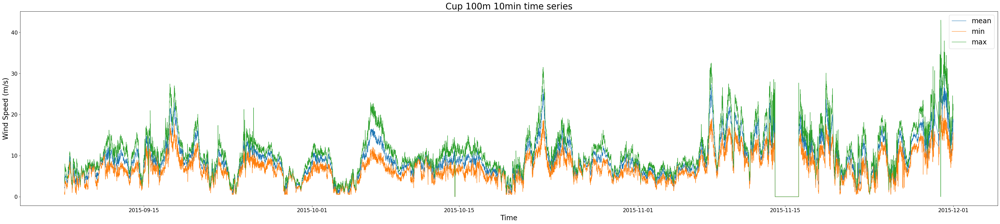

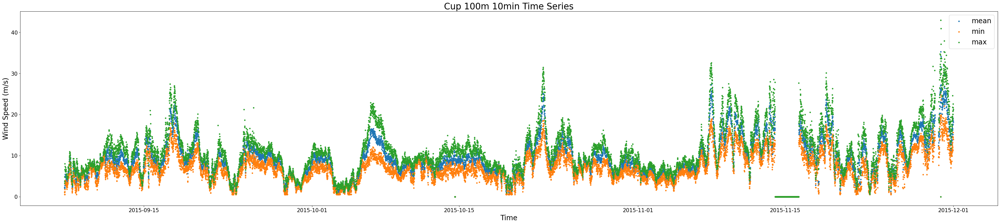

In [82]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Cup100m_Mean'], label = 'mean', linewidth=1)
plt.plot(WindData['Cup100m_Min'], label = 'min', linewidth=1)
plt.plot(WindData['Cup100m_Max'], label = 'max', linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Cup 100m 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Cup100m_Mean'], label='mean', s=10)
plt.scatter(WindData.index, WindData['Cup100m_Min'], label='min', s=10)
plt.scatter(WindData.index, WindData['Cup100m_Max'], label='max', s=10)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Cup 100m 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

#### Sonic

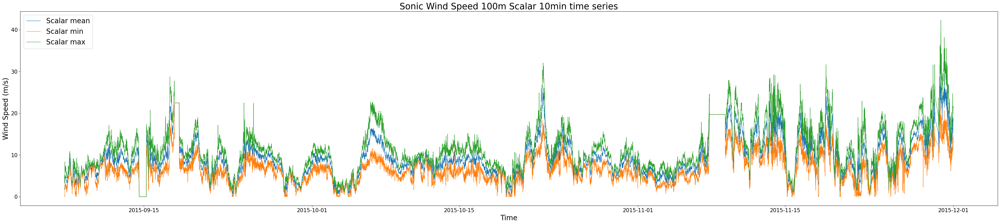

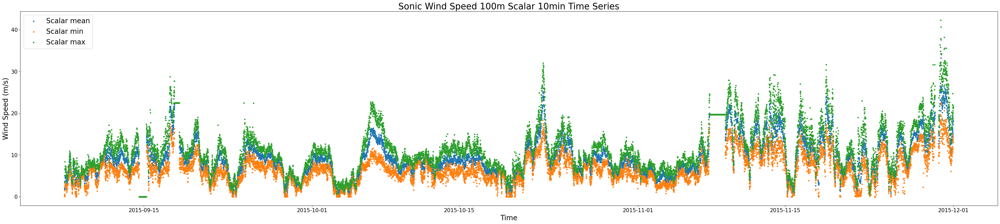

In [85]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Sonic100m_Scalar_Mean'], label = 'Scalar mean', linewidth=1)
plt.plot(WindData['Sonic100m_Scalar_Min'], label = 'Scalar min', linewidth=1)
plt.plot(WindData['Sonic100m_Scalar_Max'], label = 'Scalar max', linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Sonic Wind Speed 100m Scalar 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Sonic100m_Scalar_Mean'], label='Scalar mean', s=10)
plt.scatter(WindData.index, WindData['Sonic100m_Scalar_Min'], label='Scalar min', s=10)
plt.scatter(WindData.index, WindData['Sonic100m_Scalar_Max'], label='Scalar max', s=10)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Sonic Wind Speed 100m Scalar 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

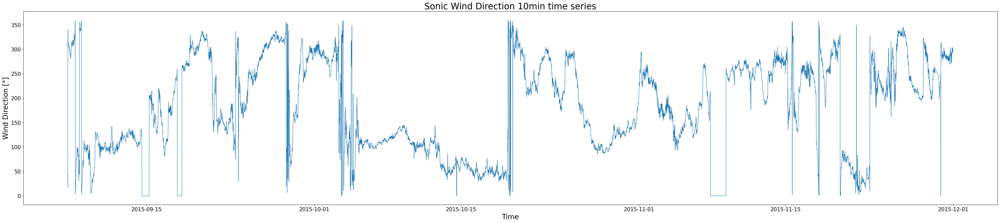

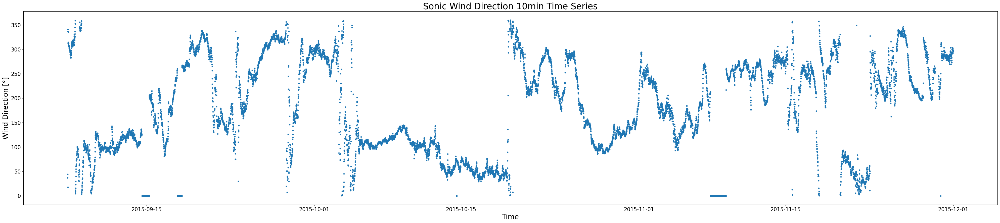

In [87]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Sonic100m_Dir'], linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Direction [°]', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Sonic Wind Direction 10min time series', fontsize=25)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Sonic100m_Dir'], s=10)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Direction [°]', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Sonic Wind Direction 10min Time Series', fontsize=25)
plt.show()

#### Termometer

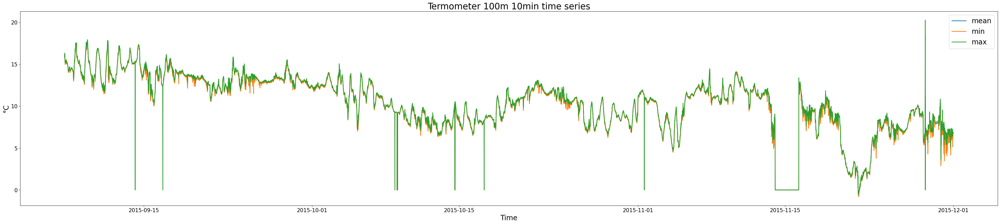

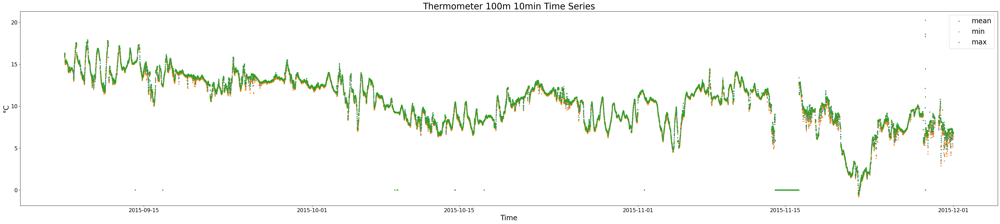

In [90]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Temp100m_Mean'], label = 'mean', linewidth=2)
plt.plot(WindData['Temp100m_Min'], label = 'min', linewidth=2)
plt.plot(WindData['Temp100m_Max'], label = 'max', linewidth=2)
plt.xlabel('Time', fontsize=20)
plt.ylabel('°C', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Termometer 100m 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Temp100m_Mean'], label='mean', s=5)
plt.scatter(WindData.index, WindData['Temp100m_Min'], label='min', s=5)
plt.scatter(WindData.index, WindData['Temp100m_Max'], label='max', s=5)
plt.xlabel('Time', fontsize=20)
plt.ylabel('°C', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Thermometer 100m 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

#### Vane

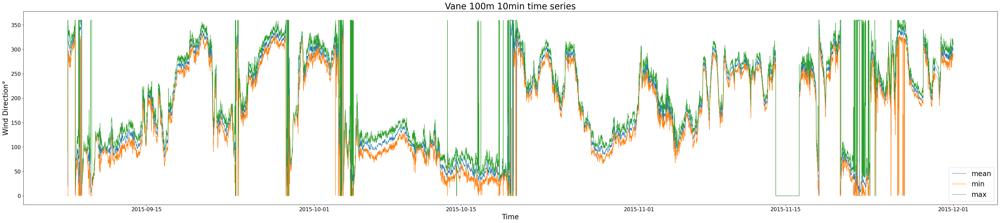

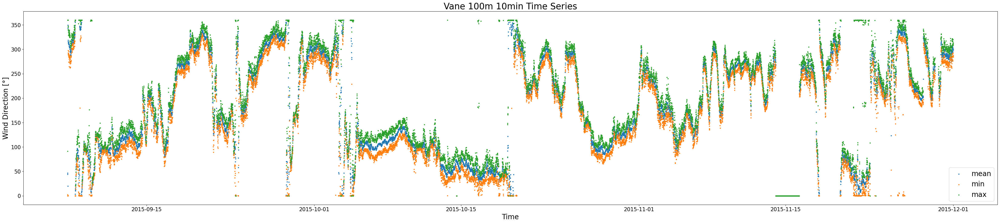

In [93]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Vane100m_Mean'], label = 'mean', linewidth=1)
plt.plot(WindData['Vane100m_Min'], label = 'min', linewidth=1)
plt.plot(WindData['Vane100m_Max'], label = 'max', linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Direction°', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Vane 100m 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Vane100m_Mean'], label='mean', s=5)
plt.scatter(WindData.index, WindData['Vane100m_Min'], label='min', s=5)
plt.scatter(WindData.index, WindData['Vane100m_Max'], label='max', s=5)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Direction [°]', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Vane 100m 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

#### Erroneous Data

By looking at the cups, vane and thermometer plots, it seems the is missing data the around the 2015-11-15. 

In [72]:
meas = ['Cup116m_Mean', 'Cup116m_Min', 'Cup116m_Max',
       'Cup114m_Mean', 'Cup114m_Min', 'Cup114m_Max',
       'Cup100m_Mean', 'Cup100m_Min', 'Cup100m_Max',
       'Vane100m_Mean', 'Vane100m_Min', 'Vane100m_Max',
       'Temp100m_Mean', 'Temp100m_Min', 'Temp100m_Max',]

In [75]:
WD_miss = WindData.loc['2015-11-13':'2015-11-16', meas]

In [78]:
WD_miss

,Cup116m_Mean,Cup116m_Min,Cup116m_Max,Cup114m_Mean,Cup114m_Min,Cup114m_Max,Cup100m_Mean,Cup100m_Min,Cup100m_Max,Vane100m_Mean,Vane100m_Min,Vane100m_Max,Temp100m_Mean,Temp100m_Min,Temp100m_Max
name,,,,,,,,,,,,,,,
2015-11-13 00:00:00,12.9849,11.10680,15.1084,12.5509,10.70210,14.7308,12.3339,10.50750,14.3475,185.904,177.146,195.623,11.33450,11.29970,11.37630
2015-11-13 00:10:00,14.1366,12.34180,16.0223,13.6846,12.04840,15.5732,13.5153,11.31790,15.3103,185.649,176.492,194.539,11.31620,11.28080,11.34200
2015-11-13 00:20:00,14.5302,12.32330,17.0416,14.0933,12.01290,16.4118,14.0141,11.97970,16.2035,183.565,175.514,191.005,11.30210,11.24650,11.37540
2015-11-13 00:30:00,14.7897,12.15100,17.5296,14.3324,11.66040,17.3253,14.1973,11.85480,17.4800,183.310,173.312,192.105,11.36340,11.31840,11.39520
2015-11-13 00:40:00,14.1170,11.50870,16.8427,13.6746,11.02120,16.2279,13.5558,11.29040,16.0941,182.961,173.072,192.044,11.37930,11.35960,11.40300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-16 23:10:00,12.8618,10.21290,14.7036,12.6062,10.14770,14.4994,12.6685,9.06809,14.4701,249.973,239.711,259.692,9.28410,9.21303,9.38583
2015-11-16 23:20:00,12.3410,10.63780,14.7408,12.0604,10.29490,14.4479,12.1887,10.01700,14.2470,242.058,231.236,255.516,9.21828,9.18098,9.24278
2015-11-16 23:30:00,11.8839,8.85100,13.3779,11.5978,8.70705,13.1929,11.6640,8.84006,13.5815,241.531,229.382,256.628,9.20990,9.16153,9.29142


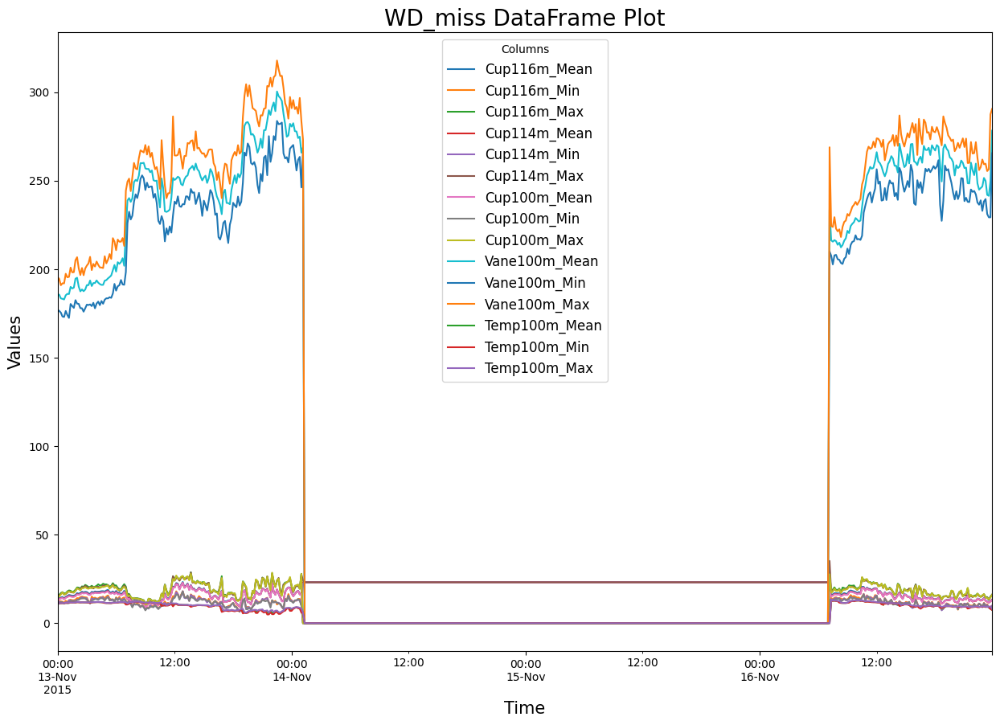

In [76]:
WD_miss.plot(figsize=(15, 10))
plt.title('WD_miss DataFrame Plot', fontsize=20)
plt.xlabel('Time', fontsize=15)
plt.ylabel('Values', fontsize=15)
plt.legend(title='Columns', fontsize=12)
plt.show()

The feilure on the recorded data starts the timestamp: 2015-11-14 01:10:00 and finishes the 2025-11-16 07:00:00 (both included). All measurements return value equal to 0 except cup 114m, which at the period has a constant value of 23.1352 for all its 3 channels.

On the other hand, the sonic seem to have 3 perods when the data recording do not work, so it keeps recording the same value (both wind speed and direction) for significant time. The periods are: \
- Around 2015-09-15
- 
- 3

In [100]:
meas2 = ['Sonic100m_Scalar_Mean', 'Sonic100m_Scalar_Min', 'Sonic100m_Scalar_Max', 'Sonic100m_Dir',]

In [ ]:
WD_miss2 = WindData.loc['2015-09-14':'2015-09-16', meas2]

In [105]:
WD_miss2

,Sonic100m_Scalar_Mean,Sonic100m_Scalar_Min,Sonic100m_Scalar_Max,Sonic100m_Dir
name,,,,
2015-09-13 00:00:00,10.45050,7.47108,13.5329,111.093
2015-09-13 00:10:00,10.00600,6.86176,13.5760,112.603
2015-09-13 00:20:00,10.09850,6.57078,12.8950,112.889
2015-09-13 00:30:00,10.21700,6.95083,13.0889,112.991
2015-09-13 00:40:00,9.77441,7.10721,12.9996,114.508
...,...,...,...,...
2015-09-16 23:10:00,8.64756,5.50145,11.2357,116.526
2015-09-16 23:20:00,8.98908,6.96226,11.1311,117.509
2015-09-16 23:30:00,8.93034,6.44773,11.2488,115.050


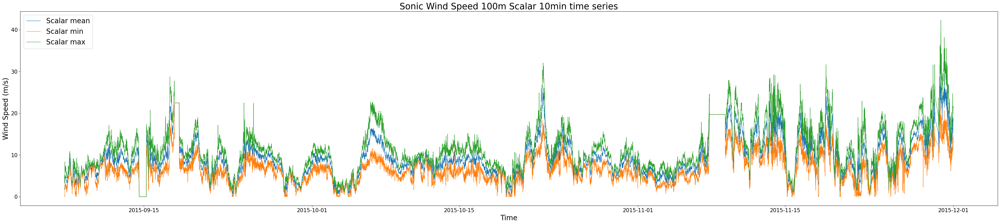

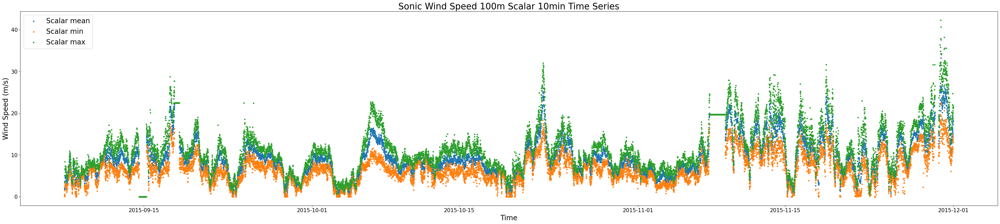

In [94]:
plt.figure(figsize=(50,10))
plt.plot(WindData['Sonic100m_Scalar_Mean'], label = 'Scalar mean', linewidth=1)
plt.plot(WindData['Sonic100m_Scalar_Min'], label = 'Scalar min', linewidth=1)
plt.plot(WindData['Sonic100m_Scalar_Max'], label = 'Scalar max', linewidth=1)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Sonic Wind Speed 100m Scalar 10min time series', fontsize=25)
plt.legend(fontsize=20)
plt.show()

plt.figure(figsize=(50, 10))
plt.scatter(WindData.index, WindData['Sonic100m_Scalar_Mean'], label='Scalar mean', s=10)
plt.scatter(WindData.index, WindData['Sonic100m_Scalar_Min'], label='Scalar min', s=10)
plt.scatter(WindData.index, WindData['Sonic100m_Scalar_Max'], label='Scalar max', s=10)
plt.xlabel('Time', fontsize=20)
plt.ylabel('Wind Speed (m/s)', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Sonic Wind Speed 100m Scalar 10min Time Series', fontsize=25)
plt.legend(fontsize=20)
plt.show()